<a href="https://colab.research.google.com/github/rushabhdhoke/Underwater-scuba-sign-language-Detection/blob/main/AI_Project_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Upload on Drive and check working

###  Importing Libraries and downloading Dataset

In [ ]:
# Reload and Matplotlib Configuration
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Import Libraries
import os
import sys
import random as rn
import numpy as np
import pandas as pd
import tensorflow as tf
from fastai.vision import *
from fastai.metrics import error_rate
import torchvision.models as models
import shutil
from subprocess import check_output
from datetime import datetime
from pathlib import Path
import torch
import re
from typing import List, Dict
import pickle


# Set Seed for Determinism
SEED_VALUE = 42

def set_deterministic(seed_value):
    os.environ['PYTHONHASHSEED'] = str(seed_value)
    np.random.seed(seed_value)
    rn.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_deterministic(SEED_VALUE)

nvidia_memory = [0, 0]
# NVIDIA GPU Memory Usage Check to check how much resources are consumed
def nvidia_smi(memory_usage):
    old_usage = memory_usage[1]
    current_usage = int(check_output(
        ['nvidia-smi', '--query-gpu=memory.used', '--format=csv,nounits,noheader']
    ))
    memory_usage[0] = current_usage
    memory_usage[1] = current_usage - old_usage
    return memory_usage

print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_memory))
torch.cuda.empty_cache()

# Current Time
current_time = datetime.now().strftime('%Y-%m-%d_%H.%M.%S')

# Dataset Configuration
DATASET_DIR = 'all-scenarios-split-cristal-clear-vs-cloudy-and-dark'
DATASET_FILENAME = DATASET_DIR + '.zip'
DATASET_URL =  'http://caddy-underwater-datasets.ge.issia.cnr.it/assets/caddy-gestures-TMP/' + DATASET_FILENAME

nvidia-smi memory usage/increment: [0, 0]


"\ncaddy_gestures_dataset_dir   = 'all-scenarios-split-cristal-clear-vs-cloudy-and-dark'\ncaddy_gestures_dataset_fname = caddy_gestures_dataset_dir + '.zip'\ncaddy_gestures_dataset_url   = 'http://caddy-underwater-datasets.ge.issia.cnr.it/assets/caddy-gestures-TMP/' + caddy_gestures_dataset_fname\n"

In [ ]:
# Ran in Google Collab so mounted on drive
from google.colab import drive
from os import walk
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
#Choose Fast AI v2 for Image Recognition which is one of the popular Deep Learing library
!pip install fastai

In [ ]:
!wget "$DATASET_URL"

--2025-01-11 03:20:04--  http://caddy-underwater-datasets.ge.issia.cnr.it/assets/caddy-gestures-TMP/all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip
Resolving caddy-underwater-datasets.ge.issia.cnr.it (caddy-underwater-datasets.ge.issia.cnr.it)... 90.147.189.211
Connecting to caddy-underwater-datasets.ge.issia.cnr.it (caddy-underwater-datasets.ge.issia.cnr.it)|90.147.189.211|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://www.caddian.eu/assets/caddy-gestures-TMP/all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip [following]
--2025-01-11 03:20:07--  http://www.caddian.eu/assets/caddy-gestures-TMP/all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip
Resolving www.caddian.eu (www.caddian.eu)... 90.147.189.211
Reusing existing connection to caddy-underwater-datasets.ge.issia.cnr.it:80.
HTTP request sent, awaiting response... 200 OK
Length: 1540347170 (1.4G) [application/zip]
Saving to: ‘all-scenarios-split-cristal-clear-vs-

In [ ]:
!md5sum "$DATASET_FILENAME"

88dd6fbfc8176d6845dd0f55f95c0c5b  all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip


In [ ]:
!unzip "$DATASET_FILENAME"
!ls

Streaming output truncated to the last 5000 lines.
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00003_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00004_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00004_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00016_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00016_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00017_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenar

In [ ]:
# Function to Verify files
def verify_md5(file_path, expected_md5):
    hash_md5 = hashlib.md5()
    try:
        with open(file_path, "rb") as f:
            for chunk in iter(lambda: f.read(4096), b""):
                hash_md5.update(chunk)
        actual_md5 = hash_md5.hexdigest()
        print(f"Computed MD5: {actual_md5}")
        print(f"Expected MD5: {expected_md5}")
        return actual_md5 == expected_md5
    except FileNotFoundError:
        print(f"File not found: {file_path}")
        return False

# Use the MD5 we got earlier to verify
expected_md5 = '88dd6fbfc8176d6845dd0f55f95c0c5b'

if verify_md5(DATASET_FILENAME, expected_md5):
    print("MD5 checksum verification passed.")
else:
    print("MD5 checksum verification failed.")

Computed MD5: 88dd6fbfc8176d6845dd0f55f95c0c5b
Expected MD5: 88dd6fbfc8176d6845dd0f55f95c0c5b
MD5 checksum verification passed.


In [ ]:
import os
import zipfile

def unzip_file(file_path, extract_to="."):
    try:
        with zipfile.ZipFile(file_path, 'r') as zip_ref:
            zip_ref.extractall(extract_to)
        print(f"Successfully extracted {file_path} to {extract_to}.")
    except FileNotFoundError:
        print(f"File not found: {file_path}")
    except zipfile.BadZipFile:
        print(f"Invalid ZIP file: {file_path}")

def list_directory(directory="."):
    try:
        items = os.listdir(directory)
        print(f"Contents of directory '{directory}':")
        for item in items:
            print(f"- {item}")
    except FileNotFoundError:
        print(f"Directory not found: {directory}")

# Unzip the dataset and list its contents
unzip_file(DATASET_FILENAME)
list_directory()

Successfully extracted all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip to ..
Contents of directory '.':
- .config
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip
- gdrive
- sample_data


# Specifying Model based on Scenarios and defying Splits

In [ ]:
# Model Specifications and Scenario Splits
def initialize_model_specs():
    """Initialize the model specifications and training scenarios."""
    models_specs = {
        'A': {'train': ['biograd-A', 'biograd-B']},
        'B': {'train': ['genova-A']},
        'C': {'train': ['brodarski-A', 'brodarski-C']},
        'F': {'train': [
            'biograd-A', 'biograd-B', 'biograd-C', 'genova-A',
            'brodarski-A', 'brodarski-B', 'brodarski-C', 'brodarski-D'
        ]}
    }
    return models_specs

def get_scenario_splits():
    """Define split percentages for scenarios."""
    return {
        'individual_split': [70, 30],     # Test sets are individual scenarios picked one by one.
        'overall_split': [70, 20, 10]    # Union of all scenarios
    }

# Initialize configurations
models_specs = initialize_model_specs()
scenario_splits = get_scenario_splits()

# Output the configurations for verification
print("Model Specifications:")
for model, specs in models_specs.items():
    print(f"Model {model}: {specs}")

print("\nScenario Splits:")
for split_type, split_ratio in scenario_splits.items():
    print(f"{split_type}: {split_ratio}")


Model Specifications:
Model A: {'train': ['biograd-A', 'biograd-B']}
Model B: {'train': ['genova-A']}
Model C: {'train': ['brodarski-A', 'brodarski-C']}
Model F: {'train': ['biograd-A', 'biograd-B', 'biograd-C', 'genova-A', 'brodarski-A', 'brodarski-B', 'brodarski-C', 'brodarski-D']}

Scenario Splits:
individual_split: [70, 30]
overall_split: [70, 20, 10]


In [ ]:
# Define Current Model and Dataset Path
curr_model = 'F'
dataset_path = Path(DATASET_DIR) / 'all-scenarios'

# List Directory Contents
def list_path_contents(path):
    """List all files and directories at the given path."""
    if path.exists():
        contents = path.ls()
        print(f"Contents of {path}:")
        for item in contents:
            print(f"- {item}")
        return contents
    else:
        print(f"Path does not exist: {path}")
        return []

# List contents of the dataset directory
list_path_contents(dataset_path)


Contents of all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios:
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up
- all-scenarios

(#17) [Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two'),Path('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up'),Path('all-scenar

# Determining the 16 classes we are trying to classify data in

In [ ]:
def find_all_dirs(directory: Path) -> List[Path]:
    """Find all directories in the given directory path."""
    if not directory.exists():
        print(f"Directory does not exist: {directory}")
        return []

    if not directory.is_dir():
        print(f"Provided path is not a directory: {directory}")
        return []

    dir_list = [x for x in directory.iterdir() if x.is_dir()]
    print(f"Found {len(dir_list)} directories in {directory}")
    return dir_list

# Find all directories in the dataset path
dir_list = find_all_dirs(dataset_path)

# Output the directories
print("Directories found:")
for d in dir_list:
    print(f"- {d}")


Found 16 directories in all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios
Directories found:
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two
- all-scenarios-split-cristal-clear-vs-cloudy-and-dark/al

In [ ]:
def find_all_files(directory: Path) -> List[Path]:
    """A list of all files within the provided path"""
    if not directory.exists():
        print(f"Directory does not exist: {directory}")
        return []

    if not directory.is_dir():
        print(f"Provided path is not a directory: {directory}")
        return []

    file_list = [x for x in directory.iterdir() if x.is_file()]
    print(f"Found {len(file_list)} files in {directory}")
    return file_list

# Process Directories and Subdirectories
for d in dir_list:
    subdir_list = find_all_dirs(d)
    print(f"Subdirectories in '{d}':")
    for sd in subdir_list:
        print(f" - {sd.stem} ({sd})")

    print(f"Processing files in subdirectories of '{d}':")
    for sd in subdir_list:
        file_list = find_all_files(sd)
        print(f"Files in '{sd}':")
        for f in file_list:
            print(f" - {f.name} ({f})")

Streaming output truncated to the last 5000 lines.
 - start_comm___brodarski-D_00247_left.jpg (all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00247_left.jpg)
 - start_comm___biograd-C_01147_right.jpg (all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01147_right.jpg)
 - start_comm___biograd-C_00372_left.jpg (all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00372_left.jpg)
 - start_comm___biograd-C_01128_left.jpg (all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01128_left.jpg)
 - start_comm___brodarski-C_00424_left.jpg (all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00424_left.jpg)
 - start_comm___biograd-C_01099_right.jpg (all-scenarios-split-c

In [ ]:
from sklearn.model_selection import train_test_split
# Create Dataset Directories
def create_split_directories(base_dir: str, subdirs: list) -> dict:
    """Create directories for dataset splits (train, valid, test) and initialize dataset structure"""
    base_path = Path(base_dir)
    base_path.mkdir(exist_ok=True)
    datasets = {}
    for subdir in subdirs:
        subdir_path = base_path / subdir
        subdir_path.mkdir(exist_ok=True)
        datasets[subdir] = subdir_path
    print(f"Created directories under: {base_dir}")
    return datasets

# Initialize Variables
split_dataset_dir = f'caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-{curr_model}'
dataset_subdirs = ['train', 'valid', 'test']
all_dataset = create_split_directories(split_dataset_dir, dataset_subdirs)

# List Contents of the Split Path
split_path = Path(split_dataset_dir)
print(f"Contents of {split_path}:")
for item in split_path.ls():
    print(f"- {item}")

# Placeholder for File Lists
file_lists = []

Created directories under: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F
Contents of caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F:
- caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/valid
- caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test
- caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train


In [ ]:
# Initialize Model Specifications
def initialize_model_specs():
    """Initialize the training scenarios"""
    models_specs = {
        'A': {'train': ['biograd-A', 'biograd-B']},
        'B': {'train': ['genova-A']},
        'C': {'train': ['brodarski-A', 'brodarski-C']},
        'F': {'train': [
            'biograd-A', 'biograd-B', 'biograd-C', 'genova-A',
            'brodarski-A', 'brodarski-B', 'brodarski-C', 'brodarski-D'
        ]}
    }
    return models_specs

models_specs = initialize_model_specs()
scenarios = models_specs['F']['train']

# Function Definitions
def initialize_datasets(scenarios: List[str], dir_list: List[Path]) -> Dict:
    """Initialize the dataset dictionaries for train/valid/test splits"""
    train_valid = {}
    test = {sc: {} for sc in scenarios}
    test['overall'] = {}  # 'overall' test set
    for sc in scenarios + ['overall']:
        for d in dir_list:
            train_valid[d.stem] = []
            test[sc][d.stem] = []
    return train_valid, test

def split_data_for_model_F(
    file_list: List[Path], d_stem: str, sc_regex: str, scenarios: List[str], test: Dict
):
    """Split files for model 'F' based on the scenario in the filename."""
    for f in file_list:
        sc = re.sub(sc_regex, '\\1', f.stem)
        if '100' in str(f):
            print(f'[{d_stem}] Found file belonging to test scenario {sc}')
        if sc in scenarios:
            test[sc][d_stem].append(f)

def split_train_valid(
    files: List[Path], split: List[int]
) -> Dict[str, List[Path]]:
    """Split files into train and validation sets sequentially"""
    files.sort()
    train_size = int(len(files) * split[0] / 100)
    train = files[:train_size]
    valid = files[train_size:]
    return {"train": train, "valid": valid}

def print_split_summary(
    d_stem: str, train: List[Path], valid: List[Path], test: Dict
):
    """Print a summary of the data splits"""
    print(f'[{d_stem}] Summary:')
    print(f'  Train: {len(train)} files')
    print(f'  Valid: {len(valid)} files')
    for sc, files in test.items():
        print(f'  Test ({sc}): {len(files)} files')

# dataset_path is defined earlier
dir_list = find_all_dirs(dataset_path)
train_valid, test = initialize_datasets(scenarios, dir_list)

# Extract scenario from filename
sc_regex = r'.*___(.*)_[0-9]*_.*'
# Train/Valid split percentages
split = [70, 30]
# Overall split percentages
overall_split = [70, 20, 10]


for d in dir_list:
    print(f"\nProcessing gesture: {d.stem}")
    subdir_list = find_all_dirs(d)

    for sd in subdir_list:
        file_list = find_all_files(sd)
        if curr_model != 'F':
            scenarios_regex = '|'.join(models_specs[curr_model]['train'])  # Regex for train/valid scenarios
            for f in file_list:
                if re.search(scenarios_regex, f.stem):
                    train_valid[d.stem].append(f)
                else:
                    sc = re.sub(sc_regex, '\\1', f.stem)
                    if sc in scenarios:
                        test[sc][d.stem].append(f)
        else:
            split_data_for_model_F(file_list, d.stem, sc_regex, scenarios, test)

# Train/Valid Split for current gesture
    if curr_model != 'F':
        train_valid[d.stem] = split_train_valid(train_valid[d.stem], split)
        train, valid = train_valid[d.stem]["train"], train_valid[d.stem]["valid"]
    else:
        train_valid[d.stem] = train_valid[d.stem] + [f for sc in scenarios for f in test[sc][d.stem]]
        train_valid[d.stem].sort()
        train = train_valid[d.stem][:int(len(train_valid[d.stem]) * overall_split[0] / 100)]
        valid = train_valid[d.stem][int(len(train_valid[d.stem]) * overall_split[0] / 100):]

    # Print Summary
    print_split_summary(d.stem, train, valid, test)

# Add Test Files to Overall Test Set
print("\nCopying test files to 'overall' test set...")
for d in dir_list:
    for sc in scenarios:
        test['overall'][d.stem] += test[sc][d.stem]

# Print Test Summary
print("\nTest Summary:")
for sc in scenarios + ['overall']:
    for d in dir_list:
        print(f"  Scenario: {sc}, Gesture: {d.stem}, Files: {len(test[sc][d.stem])}")

Found 16 directories in all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

Processing gesture: backwards
Found 2 directories in all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards
Found 692 files in all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark
[backwards] Found file belonging to test scenario biograd-C
[backwards] Found file belonging to test scenario biograd-C
Found 430 files in all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear
[backwards] Summary:
  Train: 785 files
  Valid: 337 files
  Test (biograd-A): 16 files
  Test (biograd-B): 16 files
  Test (biograd-C): 16 files
  Test (genova-A): 16 files
  Test (brodarski-A): 16 files
  Test (brodarski-B): 16 files
  Test (brodarski-C): 16 files
  Test (brodarski-D): 16 files
  Test (overall): 16 files

Processing gesture: three
Found 2 directories in all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scen

In [ ]:
def save_to_csv(data: dict, filename: str):
    """Save a dictionary as a CSV file."""
    df = pd.DataFrame.from_dict(data, orient='index')
    print(df)
    df.to_csv(filename)
    print(f"Saved CSV: {filename}")

def save_to_pickle(data: dict, filename: str):
    """Save a dictionary as a pickle file"""
    with open(filename, 'wb') as handle:
        pickle.dump(data, handle, protocol=pickle.HIGHEST_PROTOCOL)
    print(f"Saved Pickle: {filename}")

# Main Execution
def save_train_valid_test(train_valid: dict, test: dict, model: str):
    """Save train/valid and test datasets to CSV and pickle files"""
# File paths
    train_valid_csv = f"/content/train_valid-df-model-{model}.csv"
    train_valid_pkl = f"/content/train_valid-df-model-{model}.pkl"
    test_csv = f"/content/test-df-model-{model}.csv"
    test_pkl = f"/content/test-df-model-{model}.pkl"

# Save train/valid data
    print("\nSaving Train/Valid Data:")
    save_to_csv(train_valid, train_valid_csv)
    save_to_pickle(train_valid, train_valid_pkl)

# Save test data
    print("\nSaving Test Data:")
    save_to_csv(test, test_csv)
    save_to_pickle(test, test_pkl)

# Call the function to save datasets
save_train_valid_test(train_valid, test, curr_model)


Saving Train/Valid Data:
                                                                                                                                                    0     \
backwards              all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00000_left.jpg   
three                          all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00375_left.jpg   
carry                          all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00157_left.jpg   
one                                 all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_01732_left.jpg   
boat                             all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_00661_left.jpg   
num_delimiter  all-scenarios-split-cri

In [ ]:
import shutil
from pathlib import Path
from typing import List

def split_and_copy_files(
    data: dict, split: List[int], base_path: Path, mode: str):
    """Split data into train/valid and copy files to respective directories."""
    for gesture, files in data.items():
        print(f"\nProcessing gesture: {gesture}")
        # Calculate split sizes
        split_idx = int(len(files) * split[0] / 100)
        train_files = files[:split_idx]
        valid_files = files[split_idx:]
        print(f"Train: {len(train_files)} - Valid: {len(valid_files)} - Split Index: {split_idx}")

# Copy train files
        train_dst_path = base_path / 'train' / gesture
        train_dst_path.mkdir(parents=True, exist_ok=True)
        for file in train_files:
            shutil.copy(file, train_dst_path)
            print(f"Copied to Train: {file} -> {train_dst_path}")

# Copy valid files
        valid_dst_path = base_path / 'valid' / gesture
        valid_dst_path.mkdir(parents=True, exist_ok=True)
        for file in valid_files:
            shutil.copy(file, valid_dst_path)
            print(f"Copied to Valid: {file} -> {valid_dst_path}")

# Example Usage
split_path = Path("/content/split_data")  # Base directory for split data
split = [70, 30]  # Train/Valid split percentages
split_and_copy_files(train_valid, split, split_path, mode="train_valid")


Streaming output truncated to the last 5000 lines.
Copied to Train: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00374_left.jpg -> /content/split_data/train/start_comm
Copied to Train: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00374_right.jpg -> /content/split_data/train/start_comm
Copied to Train: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00426_left.jpg -> /content/split_data/train/start_comm
Copied to Train: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00426_right.jpg -> /content/split_data/train/start_comm
Copied to Train: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00427_left.jpg -> /content/split_data/train/start_comm
Co

In [ ]:
def copy_test_files(test_data: dict, scenarios: List[str], base_path: Path):
    """Copy test files into their respective scenario directories"""
    for sc in scenarios + ['overall']:
        scenario_path = base_path / 'test' / sc
        scenario_path.mkdir(parents=True, exist_ok=True)  # Create scenario directory
        print(f"\nProcessing Scenario: {sc}")

        for gesture, files in test_data[sc].items():  # Iterate over gestures and their files
            gesture_path = scenario_path / gesture
            gesture_path.mkdir(parents=True, exist_ok=True)  # Create gesture directory
            print(f"  Gesture: {gesture}, Path: {gesture_path}")

            for file in files:
                if '100' in str(file):  # Optional: Log specific files for debugging
                    print(f"    Copying file with '100' in name: {file}")
                shutil.copy(file, gesture_path)  # Copy file to the target path
                print(f"    Copied: {file} -> {gesture_path}")

# Example Usage
split_path = Path("/content/split_data")  # Base directory for split data
copy_test_files(test, scenarios, split_path)

Streaming output truncated to the last 5000 lines.
    Copied: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00822_left.jpg -> /content/split_data/test/overall/start_comm
    Copied: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01609_left.jpg -> /content/split_data/test/overall/start_comm
    Copied: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01099_right.jpg -> /content/split_data/test/overall/start_comm
    Copied: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01547_left.jpg -> /content/split_data/test/overall/start_comm
    Copied: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01021_right.jpg -> /content/split_data/test/overall/start_comm
  

In [ ]:
def list_split_directory_contents(base_path: Path, dir_list: List[Path], splits: List[str]):
    """List the contents of train/valid directories for each gesture"""
    for gesture_dir in dir_list:
# Iterate over gestures like 'up', 'down', etc.
        for split in splits:
# Process train and valid splits
            split_path = base_path / split / gesture_dir.stem
            try:
                contents = split_path.ls()
# List contents of the directory
                print(f"{len(contents)} - {contents}")
            except FileNotFoundError:
                print(f"Directory not found: {split_path}")

split_path = Path("/content/split_data")
# Base path for split data
list_split_directory_contents(split_path, dir_list, ['train', 'valid'])

897 - [Path('/content/split_data/train/backwards/backwards___biograd-C_01594_right.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-C_01372_left.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-C_00048_right.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-B_00375_right.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-C_01309_right.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-C_01603_left.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-C_00049_right.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-B_00393_right.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-A_00457_right.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-C_01605_left.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-C_00101_left.jpg'), Path('/content/split_data/train/backwards/backwards___biograd-C_01313_left.jpg'), Pa

In [ ]:
def list_test_directory_contents(base_path: Path, scenarios: List[str], dir_list: List[Path]):
    """List the contents of test directories for each scenario and gesture"""
    for scenario in scenarios + ['overall']:
# Iterate over scenarios
        for gesture_dir in dir_list:
# Process gesture directories like 'up', 'down', etc.
            test_path = base_path / 'test' / scenario / gesture_dir.stem
            try:
                contents = test_path.ls()
# List contents of the directory
                print(f"{len(contents)} - {test_path} - {contents[:2]}")
            except FileNotFoundError:
                print(f"Directory not found: {test_path}")

split_path = Path("/content/split_data")
# Base path for split data
list_test_directory_contents(split_path, scenarios, dir_list)

60 - /content/split_data/test/biograd-A/backwards - [Path('/content/split_data/test/biograd-A/backwards/backwards___biograd-A_00457_right.jpg'), Path('/content/split_data/test/biograd-A/backwards/backwards___biograd-A_00405_left.jpg')]
100 - /content/split_data/test/biograd-A/three - [Path('/content/split_data/test/biograd-A/three/three___biograd-A_00179_left.jpg'), Path('/content/split_data/test/biograd-A/three/three___biograd-A_00175_right.jpg')]
58 - /content/split_data/test/biograd-A/carry - [Path('/content/split_data/test/biograd-A/carry/carry___biograd-A_01153_right.jpg'), Path('/content/split_data/test/biograd-A/carry/carry___biograd-A_01158_left.jpg')]
58 - /content/split_data/test/biograd-A/one - [Path('/content/split_data/test/biograd-A/one/one___biograd-A_00140_right.jpg'), Path('/content/split_data/test/biograd-A/one/one___biograd-A_01213_left.jpg')]
52 - /content/split_data/test/biograd-A/boat - [Path('/content/split_data/test/biograd-A/boat/boat___biograd-A_01006_right.jp

# Defying Resnet 50 specifications

The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training set size: 44348 samples
Validation set size: 11086 samples


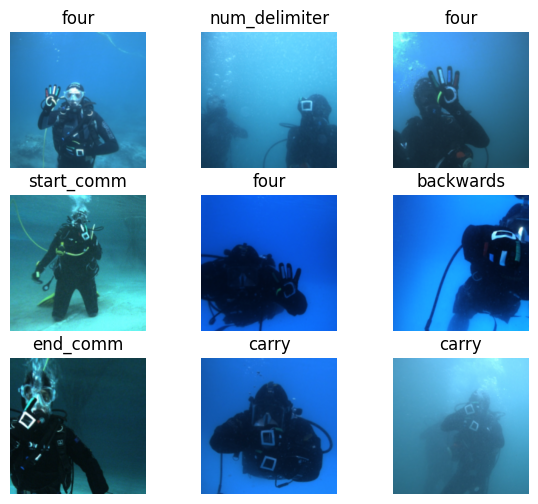

In [ ]:
from fastai.vision.all import *
from fastai.metrics import error_rate
from torchvision.models import resnet50

def initialize_model(model_name: str):
"""Initialize the CNN model configuration based on the model name"""
    if model_name == "resnet50":
        return resnet50, 224, 10, 64
    else:
        raise ValueError(f"Unsupported model name: {model_name}")

def load_data(path: Path, img_size: int, bs: int):
"""Load the dataset with transformations"""
    tfms = aug_transforms(
        max_rotate=10.0,
        max_zoom=1.1,
        max_lighting=0.2,
        max_warp=0.2,
        p_affine=0.75,
        p_lighting=0.75
    )
    data = ImageDataLoaders.from_folder(
        path,
        valid_pct=0.2,
        bs=bs,
        item_tfms=Resize(img_size),
        batch_tfms=[*tfms, Normalize.from_stats(*imagenet_stats)]
    )
    return data

def print_dataset_info(data):
"""Print information about the dataset."""
    data.show_batch(figsize=(7, 6))
    print(f"The dataset has {len(data.vocab)} ({data.c}) classes: {data.vocab}")
    print(f"Training set size: {len(data.train_ds)} samples")
    print(f"Validation set size: {len(data.valid_ds)} samples")

model_name = "resnet50"
cnn_model, img_size, epochs, bs = initialize_model(model_name)

split_path = Path("/content/split_data")  # Update this to your dataset path
data = load_data(split_path, img_size, bs)
print_dataset_info(data)

In [ ]:
learn = vision_learner(data, resnet50, metrics=[accuracy, error_rate])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 143MB/s]


Label: end_comm, Image Size: (640, 480)


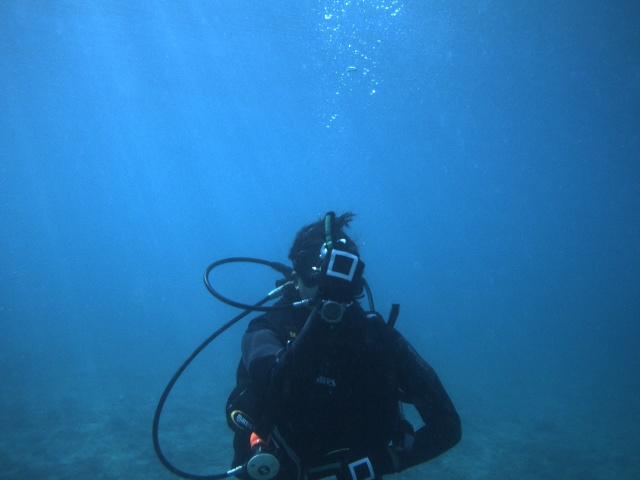

In [ ]:
# Access the image and its label index
idx = 100
img = data.train_ds[idx][0]
# Checking results on training dataset
label_idx = data.train_ds[idx][1]

# Label for the image
label_name = data.vocab[label_idx]

print(f"Label: {label_name}, Image Size: {img.size}")
img

Label: num_delimiter, Image Size: (640, 480)


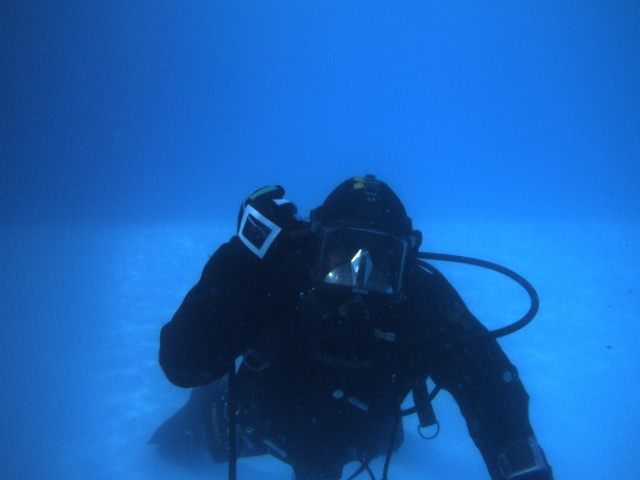

In [ ]:
# Access the image and its label index
idx = 100
img = data.valid_ds[idx][0]
# Checking results on training dataset
label_idx = data.valid_ds[idx][1]

# Label for the image
label_name = data.vocab[label_idx]

print(f"Label: {label_name}, Image Size: {img.size}")
img

# Wasn't Able to run this in same session due to Colab timeout issue, so ran in different session and attached result in Word File

In [ ]:
# Ran this earlier to determine what could be an ideal LL, it said 0.001 SP Choose LR = 1e-3
learn.lr_find(suggest_funcs=(minimum, steep))

# Start with a smaller learning rate and train for more epochs
learn.fit_one_cycle(5, lr_max=1e-4)

# Running Model

In [ ]:
# from fastai.callback.all import ShowGraphCallback, SaveModelCallback
import time

def train_or_load_model(
    model_name: str, learn, savepath: str, epochs: int, lr: float, load_saved_model: bool):
    """Train or load a model based on the load_saved_model flag"""
    if load_saved_model:
        print('Loading saved model stage-1...')
        learn.load(savepath + model_name + '-stage-1')
# Load with the model_name variable
    else:
        print(f"Training model: {model_name} for {epochs} epochs with batch size: {learn.dls.bs}")
# Train the model
        learn.fit_one_cycle(
            epochs,
            lr_max=lr,
# Use lr_max for learning rate
            cbs=[
                ShowGraphCallback(),
                SaveModelCallback(monitor='accuracy', fname=model_name + '-stage-1-' + currtime)
            ]
        )
# Save the trained model
        learn.save(savepath + model_name + '-stage-1-' + currtime)

# Main Execution
lr = 1e-3
load_saved_model = False
savepath = '/content/'
currtime = time.strftime("%Y%m%d-%H%M%S")

train_or_load_model(
    model_name=model_name,
    learn=learn,
# Ensure `learn` is initialized earlier with your `Learner`
    savepath=savepath,
    epochs=3,
# Change this to `epochs` if dynamically set earlier
    lr=lr,
    load_saved_model=load_saved_model)

Interpreting and visualizing model results...
Interpreting results for the model...


Found 9 top losses. Plotting...


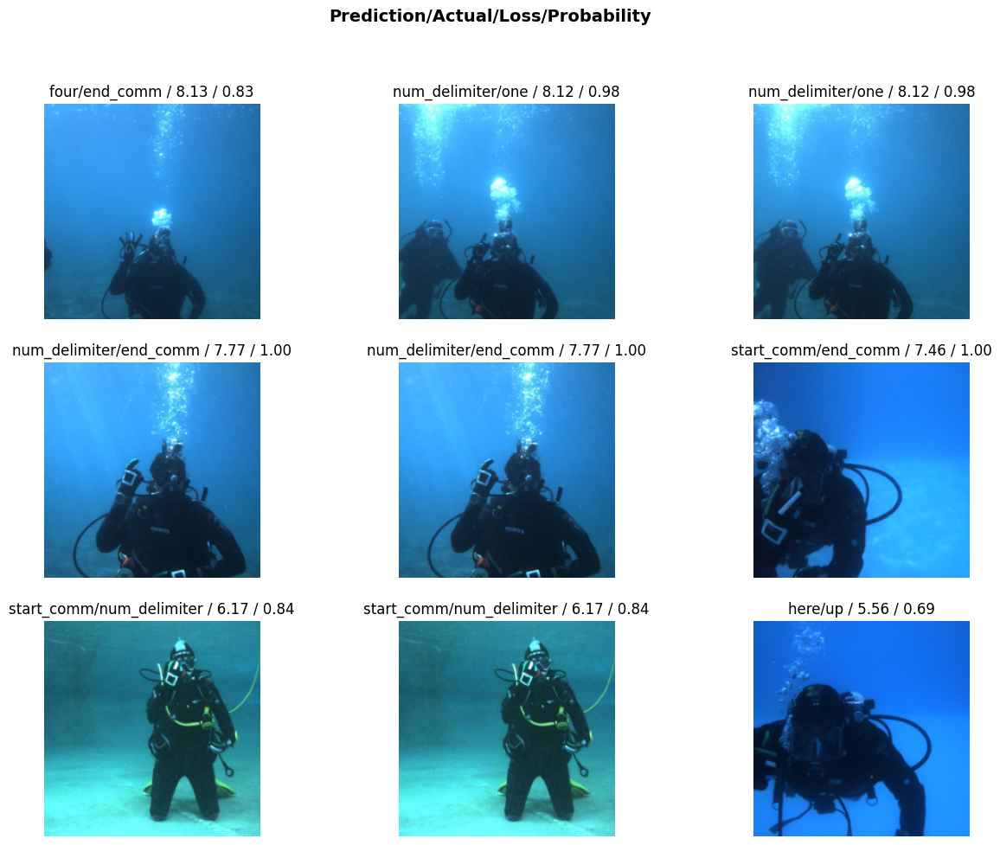

In [ ]:
from fastai.vision.all import ClassificationInterpretation
import matplotlib.pyplot as plt

def interpret_model_results(learn, n_top_losses: int = 9, figsize: tuple = (15, 11)):
    """Interpret the model results and plot top losses"""
    print('Interpreting results for the model...')
    interp = ClassificationInterpretation.from_learner(learn)

# Ensure the losses, indices, and validation dataset lengths are consistent
    losses, idxs = interp.top_losses()
    assert len(learn.dls.valid_ds) == len(losses) == len(idxs), \
        "Mismatch in validation dataset, losses, and indices lengths"

    print(f"Found {n_top_losses} top losses. Plotting...")
    interp.plot_top_losses(n_top_losses, figsize=figsize)
    plt.show()

# Example Usage
print('Interpreting and visualizing model results...')
interpret_model_results(learn, n_top_losses=9, figsize=(15, 11))


Analyzing model confusion...


Plotting confusion matrix...


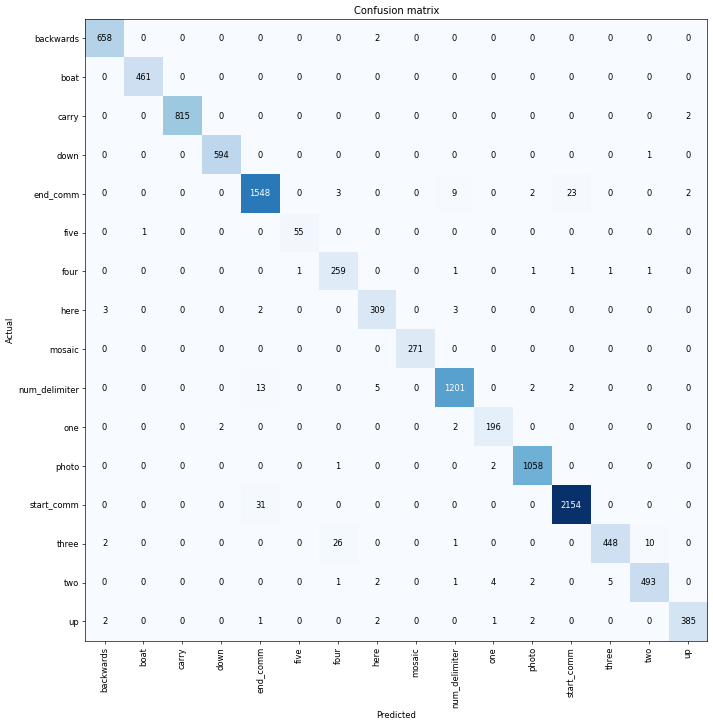


Most confused classes (min_val=2):


Actual: start_comm, Predicted: end_comm, Count: 31
Actual: three, Predicted: four, Count: 26
Actual: end_comm, Predicted: start_comm, Count: 23
Actual: num_delimiter, Predicted: end_comm, Count: 13
Actual: three, Predicted: two, Count: 10
Actual: end_comm, Predicted: num_delimiter, Count: 9
Actual: num_delimiter, Predicted: here, Count: 5
Actual: two, Predicted: three, Count: 5
Actual: two, Predicted: one, Count: 4
Actual: end_comm, Predicted: four, Count: 3
Actual: here, Predicted: backwards, Count: 3
Actual: here, Predicted: num_delimiter, Count: 3
Actual: backwards, Predicted: here, Count: 2
Actual: carry, Predicted: up, Count: 2
Actual: end_comm, Predicted: photo, Count: 2
Actual: end_comm, Predicted: up, Count: 2
Actual: here, Predicted: end_comm, Count: 2
Actual: num_delimiter, Predicted: photo, Count: 2
Actual: num_delimiter, Predicted: start_comm, Count: 2
Actual: one, Predicted: down, Count: 2
Actual: one, Predicted: num_delimiter, Count: 2
Actual: photo, Predicted: one, Count

In [ ]:
def plot_confusion_and_most_confused(interp, figsize: tuple = (12, 12), dpi: int = 60, min_val: int = 2):
""" Plot the confusion matrix and display the most confused classes"""
    print('Plotting confusion matrix...')
    interp.plot_confusion_matrix(figsize=figsize, dpi=dpi)
    plt.show()

    print(f"\nMost confused classes (min_val={min_val}):")
    most_confused = interp.most_confused(min_val=min_val)
    for actual, predicted, count in most_confused:
        print(f"Actual: {actual}, Predicted: {predicted}, Count: {count}")


print('Analyzing model confusion...')
interp = ClassificationInterpretation.from_learner(learn)
plot_confusion_and_most_confused(interp, figsize=(12, 12), dpi=60, min_val=2)


# Evaluating Results from initial run

In [ ]:
import numpy as np

def evaluate_model_from_preds(interp,data):
    """Evaluate the model using predictions and calculate accuracy"""
    print("Evaluating model on validation set...")

# Obtain predictions and targets
    preds, targs = interp.learn.get_preds()

# Convert predictions to class indices
    pred_labels = np.argmax(preds.numpy(), axis=1)
    targs = targs.numpy()

# Calculate accuracy
    correct = np.sum(pred_labels == targs)
    total = len(targs)
    acc = correct / total

# Display results
    print(f"Total samples: {total}")
    print(f"Correctly classified: {correct}")
    print(f"Accuracy: {acc:.4f}")

    return acc

# Example Usage
accuracy = evaluate_model_from_preds(interp,data)
print(f"Validation Accuracy: {accuracy:.4f}")

Evaluating model on validation set...


Total samples: 11086
Correctly classified: 10905
Accuracy: 0.9837
Validation Accuracy: 0.9837


# Repeating the same process for specific test scenario so we can check accuracy with overall data

Streaming output truncated to the last 5000 lines.
        137,009 100%  522.65kB/s    0:00:00 (xfr#12296, ir-chk=1917/14230)
train/start_comm/start_comm___brodarski-C_00480_right.jpg
        140,683 100%  534.57kB/s    0:00:00 (xfr#12297, ir-chk=1916/14230)
train/start_comm/start_comm___brodarski-C_00481_left.jpg
        136,955 100%  520.41kB/s    0:00:00 (xfr#12298, ir-chk=1915/14230)
train/start_comm/start_comm___brodarski-C_00481_right.jpg
        140,562 100%  532.04kB/s    0:00:00 (xfr#12299, ir-chk=1914/14230)
train/start_comm/start_comm___brodarski-C_00580_left.jpg
        135,443 100%  512.67kB/s    0:00:00 (xfr#12300, ir-chk=1913/14230)
train/start_comm/start_comm___brodarski-C_00580_right.jpg
        139,618 100%  526.43kB/s    0:00:00 (xfr#12301, ir-chk=1912/14230)
train/start_comm/start_comm___brodarski-C_00581_left.jpg
        138,044 100%  518.49kB/s    0:00:00 (xfr#12302, ir-chk=1911/14230)
train/start_comm/start_comm___brodarski-C_00581_right.jpg
        141,692 100% 

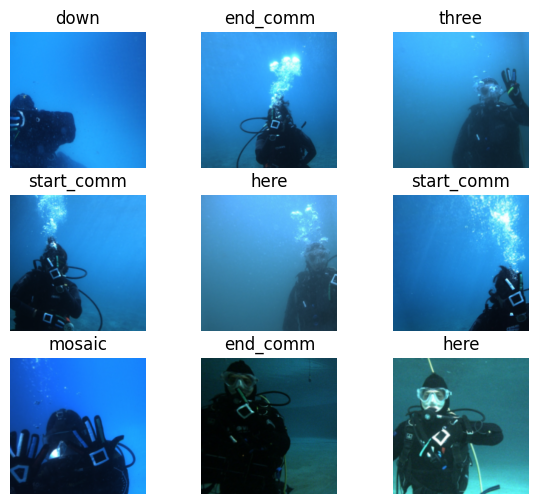

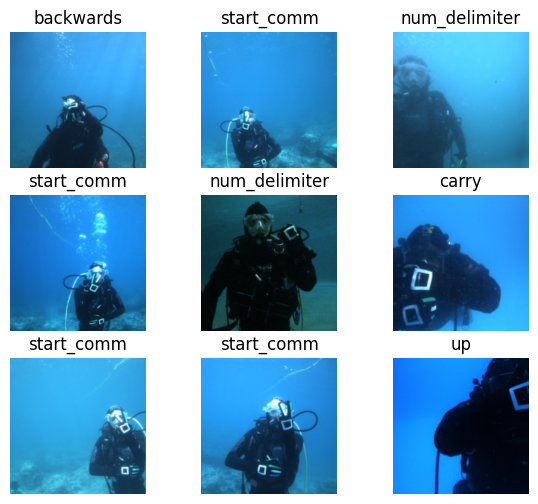

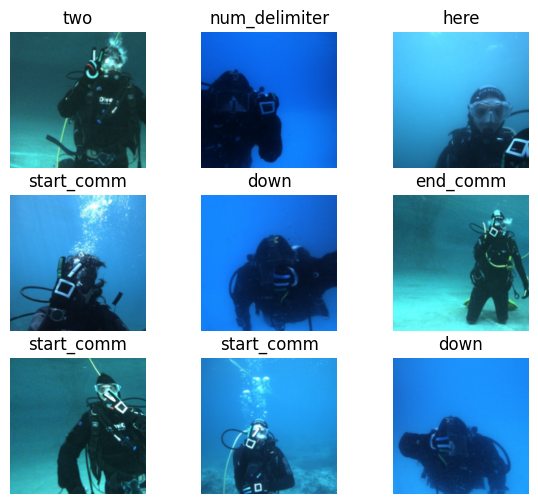

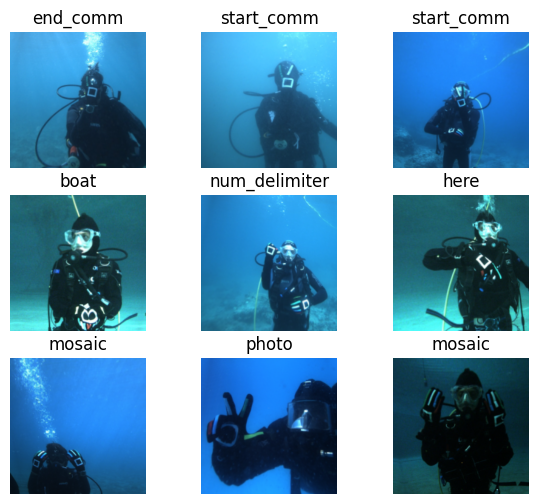

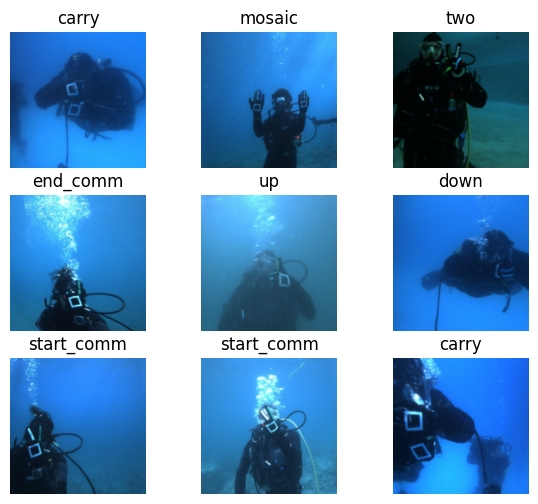

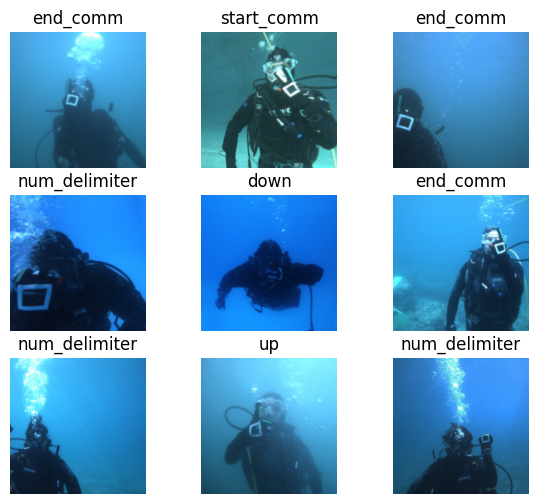

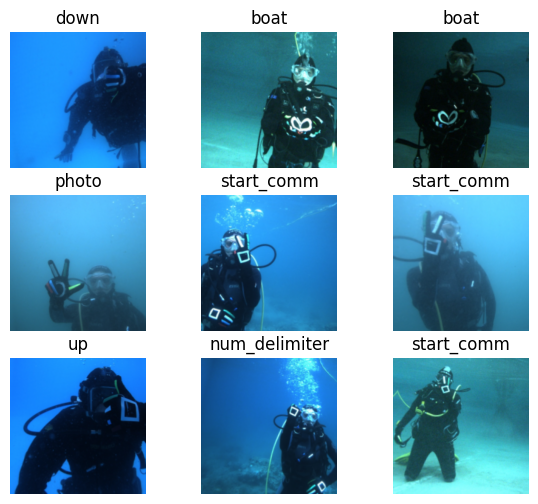

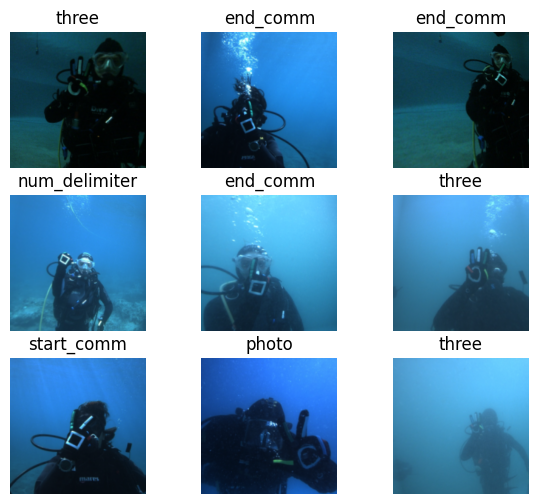

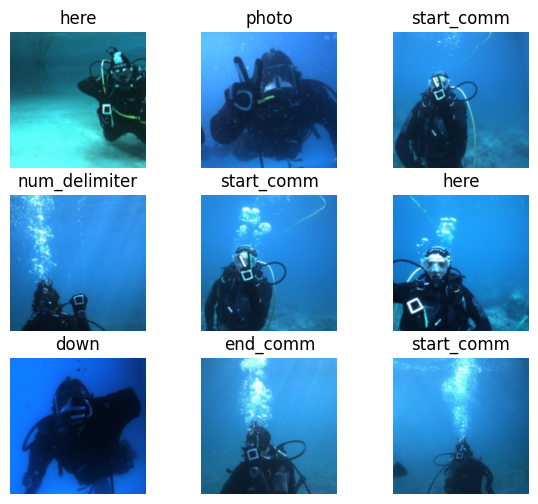

In [ ]:
import shutil
from fastai.vision.all import ImageDataLoaders, aug_transforms, Normalize, imagenet_stats

def sync_train_to_test(train_path: Path, test_path: Path):
    """Sync the train directory with the test directory to ensure Fast.ai picks up the correct scenario as the validation set"""
    print(f"Syncing train directory ({train_path}) with test directory ({test_path})...")
    !rsync -a --progress "{train_path}" "{test_path}"

def create_test_dataloaders(scenarios, curr_model, models_specs, test_path, bs, img_size):
    """Create test DataLoaders for each scenario and visualize the batches"""
    data_test = {}

    tfms = aug_transforms(
        max_rotate=10.0,
        max_zoom=1.1,
        max_lighting=0.2,
        max_warp=0.2,
        p_affine=0.75,
        p_lighting=0.75
    )

    for sc in scenarios + ['overall']:
        if (sc not in models_specs[curr_model]['train']) or (curr_model == 'F'):  # Skip training scenarios
            print(f'Creating test DataLoaders for scenario: {sc}')
            data_test[sc] = ImageDataLoaders.from_folder(
                test_path,
                train='train',
                valid=sc,
                bs=bs,
                item_tfms=Resize(img_size),
                batch_tfms=[*tfms, Normalize.from_stats(*imagenet_stats)]
            )
# Display a batch from the test DataLoader
            data_t = data_test[sc]
            data_t.show_batch(nrows=3, figsize=(7, 6))

# Print dataset details
            print(f'The dataset has {len(data_t.vocab)} ({data_t.c}) classes: {data_t.vocab}')
            print(f'Training set size: {len(data_t.train_ds)} samples')
            print(f'Validation set size: {len(data_t.valid_ds)} samples')

    return data_test

train_path = split_path / 'train'
test_path = split_path / 'test'
# Sync train directory to test directory
sync_train_to_test(train_path, test_path)
# Create test DataLoaders for all scenarios
data_test = create_test_dataloaders(scenarios, curr_model, models_specs, test_path, bs, img_size)


Label Name: backwards, Image Size: (640, 480)


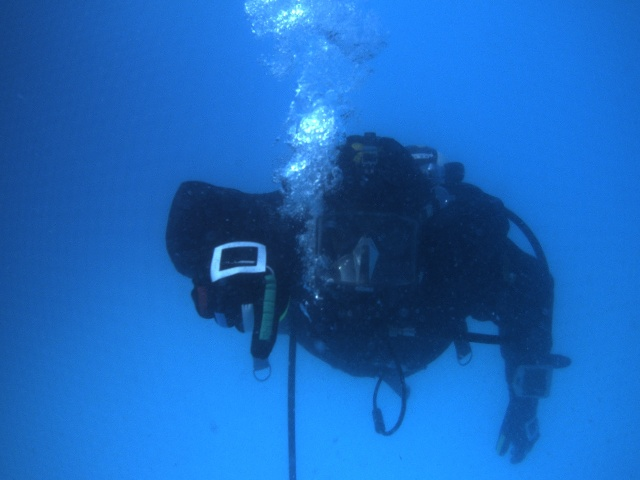

In [ ]:
idx = 100
img = data_test['genova-A'].train.dataset[idx][0]
# Access the image
label_idx = data_test['genova-A'].train.dataset[idx][1]
# Label for the image
label_name = data_test['genova-A'].vocab[label_idx]
# Display the results
print(f"Label Name: {label_name}, Image Size: {img.size}")
img

Label Name: backwards, Image Size: (640, 480)


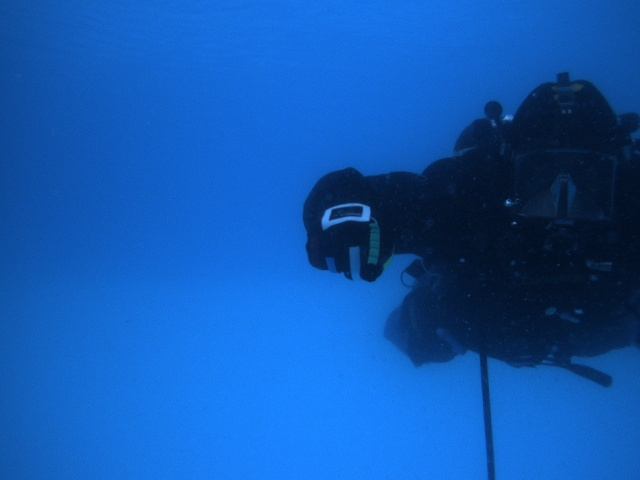

In [ ]:
idx = 100
img = data_test['genova-A'].valid.dataset[idx][0]
# Access the image
label_idx = data_test['genova-A'].valid.dataset[idx][1]
# Label for the image
label_name = data_test['genova-A'].vocab[label_idx]
# Display the results
print(f"Label Name: {label_name}, Image Size: {img.size}")
img

 Label Name: end_comm, Image Size: (640, 480)


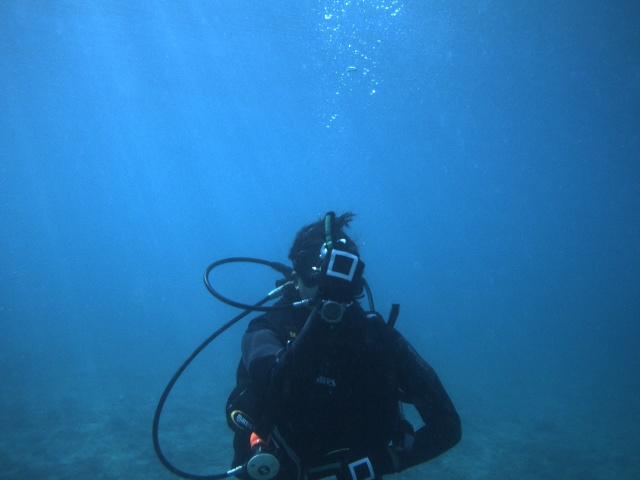

In [ ]:
idx = 100
img = data.train_ds[idx][0]
# Access the image
label_idx = data.train_ds[idx][1]
# Label for the image
label_name = data.vocab[label_idx]
# Display the label and image size
print(f" Label Name: {label_name}, Image Size: {img.size}")
img

In [ ]:
print(learn.dls, data, data_test) # Access data using learn.dls

<fastai.data.core.DataLoaders object at 0x784cd21c4ac0> <fastai.data.core.DataLoaders object at 0x784c4e368790> {'biograd-A': <fastai.data.core.DataLoaders object at 0x784c4e0fd720>, 'biograd-B': <fastai.data.core.DataLoaders object at 0x784cad69bd30>, 'biograd-C': <fastai.data.core.DataLoaders object at 0x784cdc63b310>, 'genova-A': <fastai.data.core.DataLoaders object at 0x784c4e0ffe50>, 'brodarski-A': <fastai.data.core.DataLoaders object at 0x784c4e0014e0>, 'brodarski-B': <fastai.data.core.DataLoaders object at 0x784cad6af280>, 'brodarski-C': <fastai.data.core.DataLoaders object at 0x784cad7ac100>, 'brodarski-D': <fastai.data.core.DataLoaders object at 0x784ab2a216c0>, 'overall': <fastai.data.core.DataLoaders object at 0x784ab2cc97b0>}


Interpreting results for stage-1 (test set)...
Interpreting results for genova-A (test set)...


Plotting top 9 losses for genova-A...


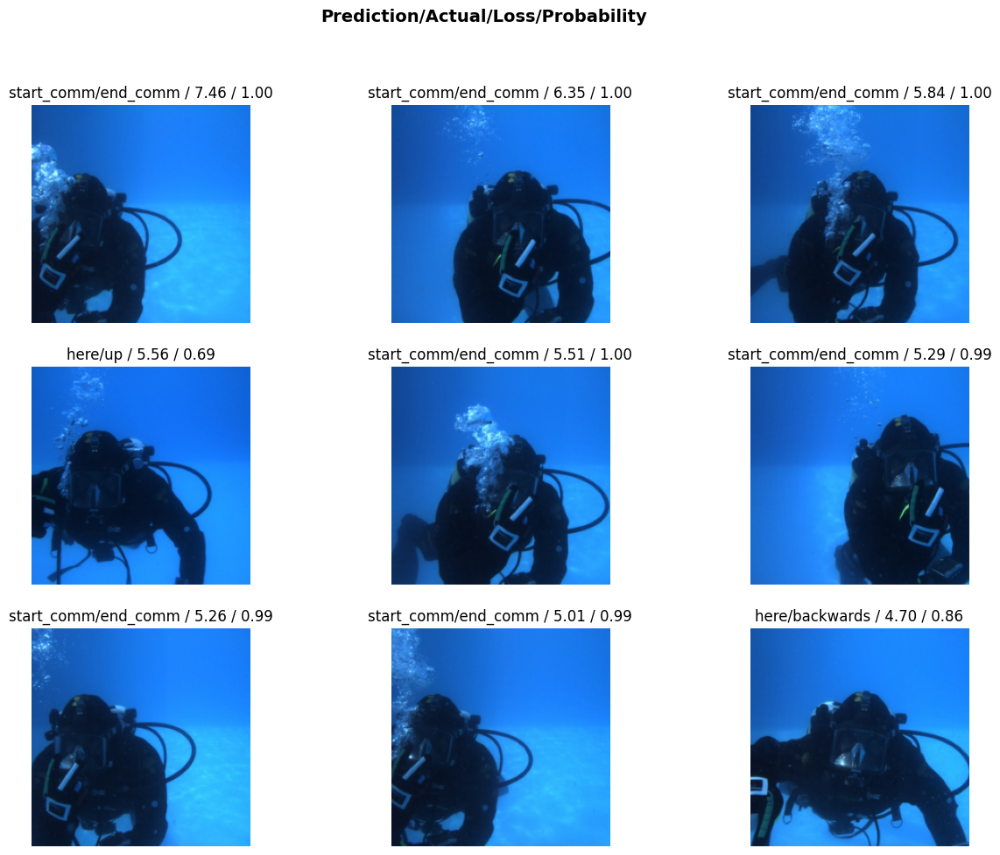

In [ ]:
from fastai.vision.all import ClassificationInterpretation
def interpret_test_results(learn, data_test, test_scenario: str, n_top_losses: int = 9, figsize: tuple = (15, 11)):
    """Interpret the results for a specific test set scenario"""
    print(f"Interpreting results for {test_scenario} (test set)...")

# Set the DataLoaders for the test scenario
    learn.dls = data_test[test_scenario]

# Generate predictions and interpret results
    interp = ClassificationInterpretation.from_learner(learn)
    losses, idxs = interp.top_losses()

# Verify consistency in dataset lengths
    valid_len = len(data_test[test_scenario].valid_ds)
    assert valid_len == len(losses) == len(idxs), \
        f"Validation set length ({valid_len}), losses ({len(losses)}), and indices ({len(idxs)}) do not match."

    print(f"Plotting top {n_top_losses} losses for {test_scenario}...")
    interp.plot_top_losses(n_top_losses, figsize=figsize)
    plt.show()
print('Interpreting results for stage-1 (test set)...')
interpret_test_results(learn, data_test, test_scenario='genova-A', n_top_losses=9, figsize=(15, 11))

Analyzing model confusion for stage-1...
Interpreting confusion matrix for genova-A (test set)...


Plotting confusion matrix...


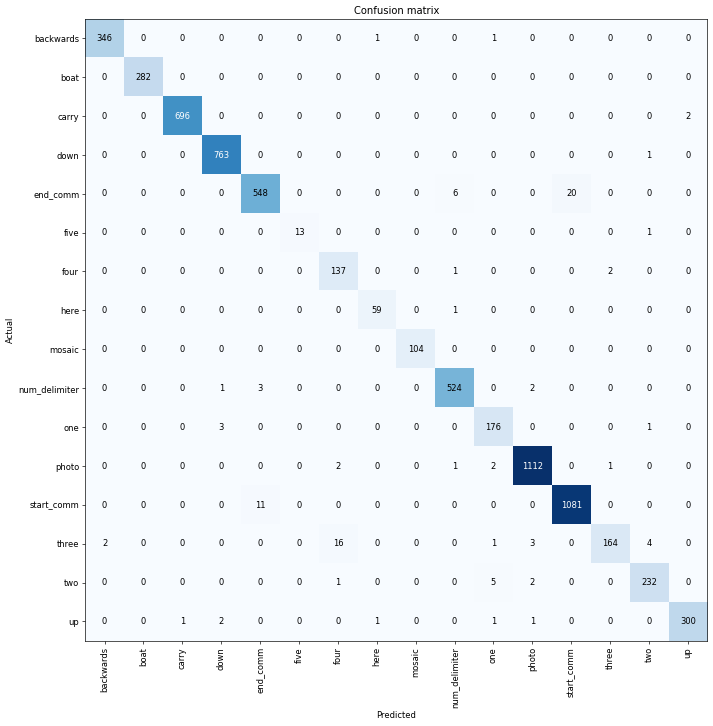


Most confused classes (min_val=2):


Actual: end_comm, Predicted: start_comm, Count: 20
Actual: three, Predicted: four, Count: 16
Actual: start_comm, Predicted: end_comm, Count: 11
Actual: end_comm, Predicted: num_delimiter, Count: 6
Actual: two, Predicted: one, Count: 5
Actual: three, Predicted: two, Count: 4
Actual: num_delimiter, Predicted: end_comm, Count: 3
Actual: one, Predicted: down, Count: 3
Actual: three, Predicted: photo, Count: 3
Actual: carry, Predicted: up, Count: 2
Actual: four, Predicted: three, Count: 2
Actual: num_delimiter, Predicted: photo, Count: 2
Actual: photo, Predicted: four, Count: 2
Actual: photo, Predicted: one, Count: 2
Actual: three, Predicted: backwards, Count: 2
Actual: two, Predicted: photo, Count: 2
Actual: up, Predicted: down, Count: 2


In [ ]:
def plot_confusion_and_most_confused(interp, figsize: tuple = (12, 12), dpi: int = 60, min_val: int = 2):
    """Plot the confusion matrix and display the most confused classes"""
    print('Plotting confusion matrix...')
    interp.plot_confusion_matrix(figsize=figsize, dpi=dpi)
    plt.show()

    print(f"\nMost confused classes (min_val={min_val}):")
    most_confused = interp.most_confused(min_val=min_val)
    for actual, predicted, count in most_confused:
        print(f"Actual: {actual}, Predicted: {predicted}, Count: {count}")

def interpret_test_confusion(learn, data_test, test_scenario: str, figsize: tuple = (12, 12), dpi: int = 60, min_val: int = 2):
    """Interpret the confusion matrix and most confused classes for a specific test scenario"""
    print(f"Interpreting confusion matrix for {test_scenario} (test set)...")

# Set the DataLoaders for the test scenario
    learn.dls = data_test[test_scenario]

# Generate predictions and interpret results
    interp = ClassificationInterpretation.from_learner(learn)

# Plot confusion matrix and display most confused classes
    plot_confusion_and_most_confused(interp, figsize=figsize, dpi=dpi, min_val=min_val)
print('Analyzing model confusion for stage-1...')
interpret_test_confusion(learn, data_test, test_scenario='genova-A', figsize=(12, 12), dpi=60, min_val=2)


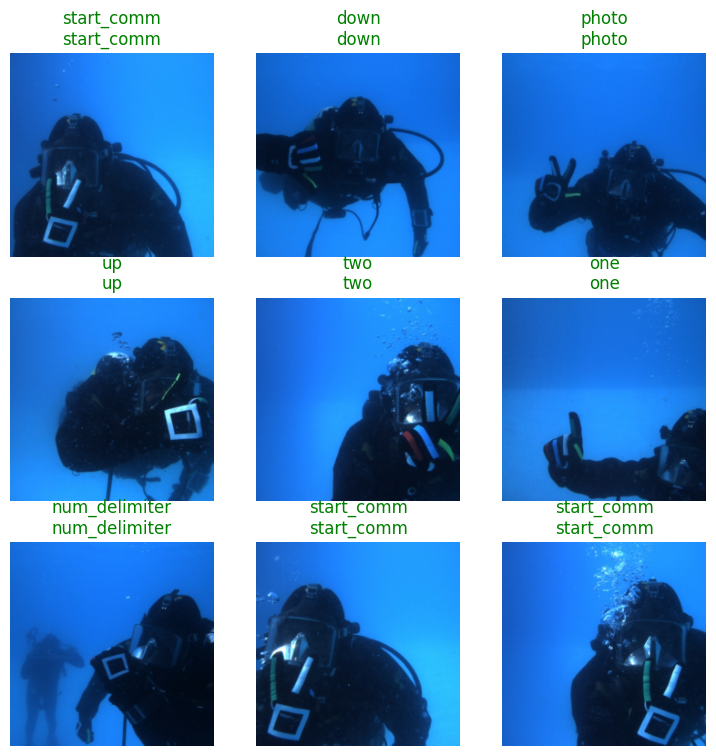

In [ ]:
learn.show_results()

In [ ]:
accuracies = {}
accuracies[curr_model] = {}

for sc in scenarios + ['overall']:
    if (sc not in models_specs[curr_model]['train']) or curr_model == 'F':
        print(10*'-') #added to create a seperation between each set
        print(f'Selecting the test DataBunch data_test[{sc}]')
        data_t = data_test[sc]
        print(f'The dataset has {len(data_t.vocab)} ({data_t.c}) classes: {data_t.vocab}')
        print(f'Training   set size is: {len(data_t.train_ds)}') # Use len(data_t.train_ds) for training set size
        print(f'Validation set size is: {len(data_t.valid_ds)}') # Use len(data_t.valid_ds) for validation set size

        learn.data = data_t

        print(f'Interpreting results for model-{curr_model} (test set) on scenario {sc}')
        interp = ClassificationInterpretation.from_learner(learn)
        losses,idxs = interp.top_losses()

        print('Plotting confusion matrix/top confused for stage-1')
        interp.most_confused(min_val=2)
        accuracies[curr_model][sc] = evaluate_model_from_preds(interp,data)
        print(f'End of testing for model-{curr_model} against test DataBunch {sc}')
        print(10*'-') #added to create a seperation between each set

--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[biograd-A]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 3456
Interpreting results for model-F (test set) on scenario biograd-A


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch biograd-A
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[biograd-B]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 1950
Interpreting results for model-F (test set) on scenario biograd-B


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch biograd-B
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[biograd-C]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 3610
Interpreting results for model-F (test set) on scenario biograd-C


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch biograd-C
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[genova-A]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 6640
Interpreting results for model-F (test set) on scenario genova-A


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch genova-A
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[brodarski-A]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 454
Interpreting results for model-F (test set) on scenario brodarski-A


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch brodarski-A
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[brodarski-B]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 174
Interpreting results for model-F (test set) on scenario brodarski-B


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch brodarski-B
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[brodarski-C]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 1546
Interpreting results for model-F (test set) on scenario brodarski-C


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch brodarski-C
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[brodarski-D]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 648
Interpreting results for model-F (test set) on scenario brodarski-D


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch brodarski-D
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Selecting the test DataBunch data_test[overall]
The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: 14776
Validation set size is: 18478
Interpreting results for model-F (test set) on scenario overall


Plotting confusion matrix/top confused for stage-1


Evaluating model on validation set...


Total samples: 6640
Correctly classified: 6537
Accuracy: 0.9845
End of testing for model-F against test DataBunch overall
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------


In [ ]:
import pandas as pd
def print_accuracies(curr_model: str, models_specs: dict, scenarios: list, accuracies: dict):
    """Print the accuracy of the model tested against each scenario."""
    for sc in scenarios + ['overall']:
        if (sc not in models_specs[curr_model]['train']) or curr_model == 'F':
            print(f'Accuracy for model-{curr_model} tested against scenario {sc}: {accuracies[curr_model][sc]:0.5f}')

def save_accuracies_to_csv(accuracies: dict, curr_model: str, filepath: str):
    """Save accuracies to a CSV file"""
    accuracies_df = pd.DataFrame.from_dict(accuracies)
    print(accuracies_df)
    accuracies_df.to_csv(filepath, index=False)
    print(f"Accuracies saved to {filepath}")
accuracies_filepath = f'/content/accuracies-df-model-{curr_model}.csv'

print_accuracies(curr_model, models_specs, scenarios, accuracies)
save_accuracies_to_csv(accuracies, curr_model, accuracies_filepath)

Accuracy for model-F tested against scenario biograd-A: 0.98449
Accuracy for model-F tested against scenario biograd-B: 0.98449
Accuracy for model-F tested against scenario biograd-C: 0.98449
Accuracy for model-F tested against scenario genova-A: 0.98449
Accuracy for model-F tested against scenario brodarski-A: 0.98449
Accuracy for model-F tested against scenario brodarski-B: 0.98449
Accuracy for model-F tested against scenario brodarski-C: 0.98449
Accuracy for model-F tested against scenario brodarski-D: 0.98449
Accuracy for model-F tested against scenario overall: 0.98449
                    F
biograd-A    0.984488
biograd-B    0.984488
biograd-C    0.984488
genova-A     0.984488
brodarski-A  0.984488
brodarski-B  0.984488
brodarski-C  0.984488
brodarski-D  0.984488
overall      0.984488
Accuracies saved to /content/accuracies-df-model-F.csv


## Wasn't Able to understand why Accuracy was same for all Scenarios, needs some Troubleshooting

#### Exporting Modelt in a Pickle File so can be run directly without having to run this whole code again

In [ ]:
import os # Import os module
learn.export('Scuba_Gesture_Detection_NN.pkl')
print(f"Model saved to: {os.getcwd()}/Scuba_Gesture_Detection_NN.pkl")

Model saved to: /content/Scuba_Gesture_Detection_NN.pkl
